In [22]:
%load_ext autoreload
%autoreload 2

from pathlib import Path

from hloc import extract_features, match_features
from hloc import pairs_from_retrieval_resampling, localize_sfm, visualization
from hloc.utils import viz_3d
import pycolmap

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Helper functions

In [23]:
def get_images_from_recon(sfm_model):
    """Get a sorted list of images in a reconstruction"""
    # NB! This will most likely be a SUBSET of all the images in a folder like images/gTHMvU3XHBk

    if isinstance(sfm_model, (str, Path)):
        sfm_model = pycolmap.Reconstruction(sfm_model)
    
    img_list = [img.name for img in sfm_model.images.values()]
    
    return sorted(img_list)

def create_query_file(sfm_model, query_list, output):
    """Create a query file used for localization"""

    # Format:
    # img_name cam_model width height cam_params0, cam_params1,...

    if isinstance(sfm_model, (str, Path)):
        sfm_model = pycolmap.Reconstruction(sfm_model)

    cams = {}

    for k, cam in sfm_model.cameras.items():
        params = " ".join([f"{p:.6f}" for p in cam.params])
        cams[k] = f"{cam.model_name} {cam.width} {cam.height} {params}"

    with open(output, "w+") as file:
        for query in query_list:
            i = sfm_model.find_image_with_name(query)
            file.write(f"{query} {cams[i.camera_id]}\n")

def isnotebook():
    try:
        shell = get_ipython().__class__.__name__
        if shell == 'ZMQInteractiveShell':
            return True   # Jupyter notebook or qtconsole
        elif shell == 'TerminalInteractiveShell':
            return False  # Terminal running IPython
        else:
            return False  # Other type (?)
    except NameError:
        return False      # Probably standard Python interpreter

# Pipeline for localization of a target model against a reference model

We take images from the target model and query against the reference model
then we try to align the target model with the reference model

## Setup
Declare the paths to images, the reconstructions and localization outputs, and we choose the matcher.

In [24]:
num_loc = 10 # Number of retrieval pairs to generate for each query image
N = 10 # Use every Nth image from the images in the target reconstruction as query image

# Video ids of reference model and target model
# Feel free to switch reference and target
reference = 'gTHMvU3XHBk'
target = 'TZIHy1cZJ-U'

# Setup the paths
base_dir = Path('/cluster/project/infk/courses/252-0579-00L/group07')

images = base_dir / 'datasets' / 'images'
models = base_dir / 'outputs' / 'old' / 'models-merge-testing3'
outputs = models / 'merge' / f'merge_{target}_{reference}'

outputs.mkdir(exist_ok=True, parents=True)

# This is the reference and target model path
reference_sfm = models / reference
target_sfm = models / target

# Retrieval pairs from target to reference
loc_pairs = outputs / f'pairs-query-netvlad{num_loc}.txt'  # top-k retrieved by NetVLAD

# Results file containing the estimated poses of the queries
results = outputs / f'Merge_hloc_superpoint+superglue_netvlad{num_loc}.txt'

# Configurations
retrieval_conf = extract_features.confs['netvlad']
feature_conf = extract_features.confs['superpoint_aachen']
matcher_conf = match_features.confs['superglue']

## Setup paths for features, global descriptors for reference and target model

In [25]:
# Path to local features
# features = extract_features.main(feature_conf, images, outputs)
features = models / 'feats-superpoint-n4096-r1024.h5'


# Path to the global descriptors
# global_descriptors = extract_features.main(retrieval_conf, images, outputs)
global_descriptors = models / 'global-feats-netvlad.h5'

# Get images from target model
query_images = get_images_from_recon(target_sfm)


# Use a subset of the images from the target model as queries
# query_list = query_images[::N]
query_list = query_images

## Find image pairs via image retrieval
For each image find the $k$ most similar ones. A larger $k$ improves the robustness of the localization for difficult queries but makes the matching more expensive.

[2022/06/07 10:47:58 hloc INFO] Extracting image pairs from a retrieval database.


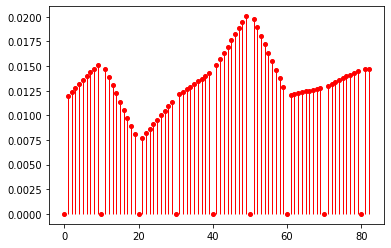

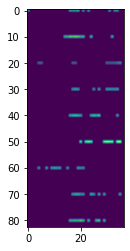

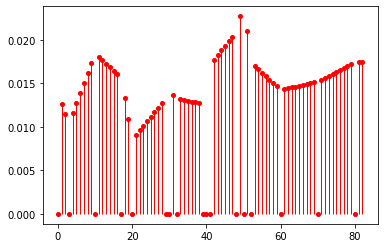

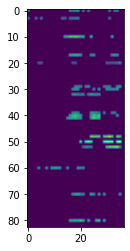

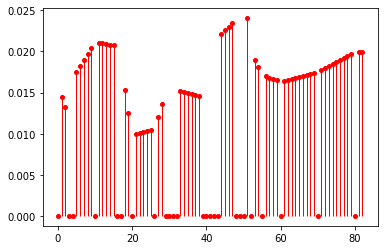

...

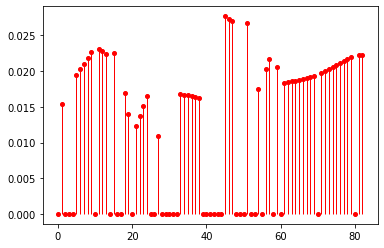

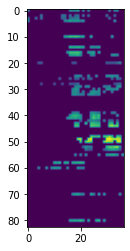

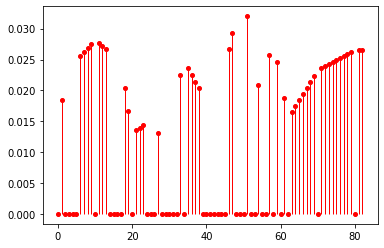

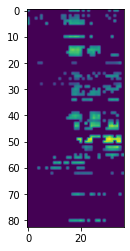

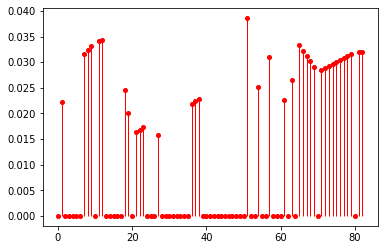

[2022/06/07 10:48:01 hloc INFO] Found 80 pairs.


<Figure size 432x288 with 0 Axes>

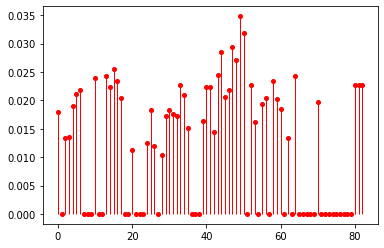

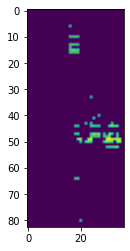

In [34]:
# TODO: need to tweak min score...

# Do retrieval from target-queries to reference 
used_queries, scores = pairs_from_retrieval_resampling.main(
    global_descriptors, loc_pairs, num_loc,
    query_list=query_list, query_interval=N, resample_runs=5, db_model=reference_sfm, min_score=0.05, visualize=True, seed=2)


In [66]:
# Create a text file containing query images names and camera parameters
# query/night/nexus5x/IMG_20161227_172439.jpg SIMPLE_RADIAL 1600 1200 1199.91 800 600 -0.0324314
queries_file = outputs / f'{target}_queries_with_intrinsics.txt'
create_query_file(target_sfm, used_queries, queries_file)

## Match the query images

In [67]:
# Output path of matches
matches = Path(models, f'{features.stem}_{matcher_conf["output"]}_{loc_pairs.stem}.h5')

# Do matching for the pairs
loc_matches = match_features.main(
    matcher_conf, loc_pairs, features=features, matches=matches)


[2022/06/06 22:49:02 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


100%|██████████| 45/45 [04:49<00:00,  6.42s/it]
[2022/06/06 22:53:53 hloc INFO] Finished exporting matches.


## Localize!
Perform hierarchical localization using the precomputed retrieval and matches. The file `Merge_hloc_superpoint+superglue_netvlad10.txt` will contain the estimated query poses. Have a look at `Merge_hloc_superpoint+superglue_netvlad10.txt_logs.pkl` to analyze some statistics and find failure cases.

In [68]:
#TODO: need to tweak ranscac_thresh and other options
# Do localization of queries
localize_sfm.main(
    reference_sfm,
    queries_file,
    loc_pairs,
    features,
    loc_matches,
    results,
    #ransac_thresh=12,
    covisibility_clustering=False)  # not required with SuperPoint+SuperGlue


[2022/06/06 22:54:21 hloc.utils.parsers INFO] Imported 80 images from TZIHy1cZJ-U_queries_with_intrinsics.txt
[2022/06/06 22:54:21 hloc INFO] Reading the 3D model...
[2022/06/06 22:54:21 hloc INFO] Starting localization...
100%|██████████| 80/80 [00:08<00:00,  9.38it/s]
[2022/06/06 22:54:29 hloc INFO] Localized 20 / 80 images.
[2022/06/06 22:54:29 hloc INFO] Writing poses to /cluster/project/infk/courses/252-0579-00L/group07/outputs/old/models-merge-testing3/merge/merge_TZIHy1cZJ-U_gTHMvU3XHBk/Merge_hloc_superpoint+superglue_netvlad10.txt...
[2022/06/06 22:54:29 hloc INFO] Writing logs to /cluster/project/infk/courses/252-0579-00L/group07/outputs/old/models-merge-testing3/merge/merge_TZIHy1cZJ-U_gTHMvU3XHBk/Merge_hloc_superpoint+superglue_netvlad10.txt_logs.pkl...
[2022/06/06 22:54:29 hloc INFO] Done!


## Functions used for finding the transform between reference and target model

In [69]:
import numpy as np

def parse_pose_estimates(pose_estimate_file):
    pose_estimates = np.genfromtxt(pose_estimate_file, delimiter=' ', dtype=None, encoding=None)

    pose_dict = {}
    for pose_est in pose_estimates:
        img_name, *qvec, x, y, z = pose_est
        pose_dict[img_name] = pycolmap.Image(tvec=[x, y, z], qvec=np.array(qvec))
    
    return pose_dict


def calculate_transform(pose1, pose2, scale=1.0):
    """Calculates the transformation which aligns model 1 with model 2, pose{1,2} is the pose of the same image in the two different models"""
    
    # w1 target
    # w2 reference
    # relative_pose = pycolmap.relative_pose(pose_estimate['qvec'], R_c_w1 @ pose_estimate['tvec'], test_img_colmap.qvec, R_c_w1 @ test_img_colmap.tvec)
    # transform = pycolmap.SimilarityTransform3(1, *relative_pose)

    # Rotation matrices which transforms from the local frame of the pose (image) to the respective world frames 1 and 2
    R_c_w1 = pycolmap.qvec_to_rotmat(pose1.qvec).T
    R_c_w2 = pycolmap.qvec_to_rotmat(pose2.qvec).T

    # Rotation matrix from world frame 1 to 2
    R_w1_w2 = R_c_w2 @ R_c_w1.T

    # Translation from respective world frame to the pose (image) center in the local frame
    r_w1c_c = - pose1.tvec
    r_w2c_c = - pose2.tvec

    # Translation from world frame 1 to world frame 2 in world frame 2
    r_w2w1_w2 = R_c_w2 @ (r_w2c_c - r_w1c_c)

    q_w1_w2 = pycolmap.rotmat_to_qvec(R_w1_w2)

    transform = pycolmap.SimilarityTransform3(scale, q_w1_w2, r_w2w1_w2)

    return transform


## Crude RANSAC search for best transform

In [70]:

max_distance_error = 3
max_angle_error = 5 # in degrees
max_inliers = 0
best_transform = None
best_query = ""
best_scale = 1.0
best_distance_error = 10000
best_angle_error = 180
max_it = 400
num_it = 0
# Calculate standard deviation for scale distribution according to 1.96 rule
# this std means that 95% of all samples will lie inside the interval [0.7, 1.3]
scale_std = 0.3 / 1.96

# TODO: load the pkl file to get number of inliers and ratio
# We should trust pose estimates with a high number of inliers more than other ones...

# Load the estimates for the query poses in the frame of the reference model
pose_estimates = parse_pose_estimates(results)

target_model = pycolmap.Reconstruction(target_sfm)

# TODO: exchange outer loop with a while loop with max iterations and random sample
# for img_name1, pose_est1 in pose_estimates.items():
while num_it < max_it:
    ind = np.random.randint(len(pose_estimates.keys()))
    img_name1 = list(pose_estimates.keys())[ind]
    pose_est1 = pose_estimates[img_name1]
    # pose_est1 is the pose of the query in the frame of the reference model

    # Get a random scale sample
    scale1 = np.random.normal(1.0, scale_std)

    # We try to rotate the target model such that it aligns with the reference model
    target_model_trans_tmp = pycolmap.Reconstruction(target_sfm)

    # Pose of the query in the original target model frame
    pose_in_target1 = target_model.find_image_with_name(f'{target}/' + img_name1)

    # Transform which hopefully aligns the target model with the reference model
    transform1 = calculate_transform(pose_in_target1, pose_est1, scale1)
    target_model_trans_tmp.transform(transform1)


    inliers = 0
    inliers_d = []
    inliers_ang = []
    # 'Inner loop' comparing the transformation found against the other pose estimates
    for img_name2, pose_est2 in pose_estimates.items():

        pose_in_target2 = target_model_trans_tmp.find_image_with_name(f'{target}/' + img_name2)
        
        # This transform should be equal to a rotation matrix like identity 
        # and zero translation if the pose_est1 and pose_est2 agree 
        transform2 = calculate_transform(pose_in_target2, pose_est2)

        # Somebody needs to checkthis formula, supposed to compute the angle of the rotation
        theta = np.arccos((np.trace(pycolmap.qvec_to_rotmat(transform2.rotation)) - 1) / 2)
        angle = theta * 180 / np.pi

        # Do not know what scale we have...
        d = np.linalg.norm(transform2.translation)

        # Debug
        # print(f"query1: {img_name1}, query2: {img_name2},  angle error: {angle:.3f}, distance error: {d:.3f}")

        if d < max_distance_error and angle < max_angle_error:
            inliers+=1
            inliers_d.append(d)
            inliers_ang.append(angle)

    if inliers > max_inliers or (inliers == max_inliers and np.mean(inliers_d) < best_distance_error and np.mean(inliers_ang) < best_angle_error):
        max_inliers = inliers
        best_transform = transform1
        best_query = img_name1
        best_scale = scale1
        best_distance_error = np.mean(inliers_d)
        best_angle_error = np.mean(inliers_ang)
        print(f"currently best query: {best_query}, scale: {scale1}, {max_inliers}/{len(pose_estimates.keys())} inliers")
    
    num_it += 1

print(f"The best transform found for query: {best_query} with scale {best_scale} and")
print(best_transform)
# TODO: save best transform

# Then, after we run this same pipeline with reference and target switched, find the best / average transformation
# Or, we change this pipeline to do both tasks at the same time such that we can run RANSAC for poses both ways to be more robust! 


currently best query: TZIHy1cZJ-U_img_fps2_00052.jpg, scale: 0.9823379822071141, 10/20 inliers
currently best query: TZIHy1cZJ-U_img_fps2_00038.jpg, scale: 1.4879249127420457, 10/20 inliers
The best transform found for query: TZIHy1cZJ-U_img_fps2_00038.jpg with scale 1.4879249127420457 and
SimilarityTransform3:
  0.466651  0.0538342   -1.41183    6.61493
  0.027722    1.48621  0.0658333   0.238441
   1.41258 -0.0469512    0.46511    4.51834
         0          0          0          1


## Vizualize the reference and target model after applying transform

Models should hopefully fit well in rotation and translation, suspect that the scale might be off

In [71]:
reference_model = pycolmap.Reconstruction(reference_sfm)

target_model_transformed = pycolmap.Reconstruction(target_sfm)
target_model_transformed.transform(best_transform)

if isnotebook():
    fig = viz_3d.init_figure()
    # fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )
    viz_3d.plot_reconstruction(fig, reference_model, color='rgba(255,0,0,0.2)', name="reference")
    viz_3d.plot_reconstruction(fig, target_model_transformed, color='rgba(0,255,0,0.2)', name="target transformed")
    fig.show()

## Visualizing the localization
We parse the localization logs and for each query image plot matches and inliers with a few database images.

KeyError: 'inliers'

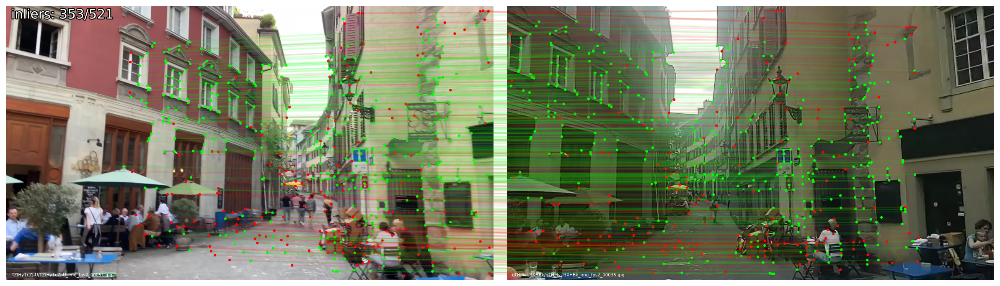

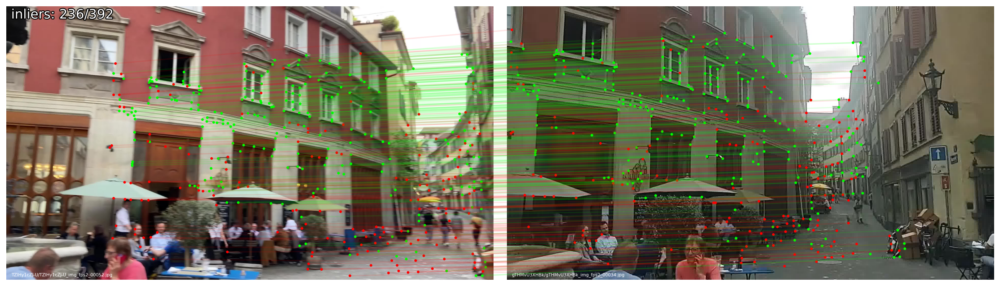

In [75]:
visualization.visualize_loc(
    results, images, reference_sfm, n=5, top_k_db=1, prefix=None, dpi=150)

## Visualizing the reference SfM model
We visualize some of the database images with their detected keypoints.

Color the keypoints by track length: red keypoints are observed many times, blue keypoints few.

In [ ]:
visualization.visualize_sfm_2d(reference_sfm, images, n=1, color_by='track_length')

Color the keypoints by visibility: blue if sucessfully triangulated, red if never matched.

In [ ]:
visualization.visualize_sfm_2d(reference_sfm, images, n=1, color_by='visibility')

Color the keypoints by triangulated depth: red keypoints are far away, blue keypoints are closer.

In [ ]:
visualization.visualize_sfm_2d(reference_sfm, images, n=1, color_by='depth')